In [258]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# 1. Carga el archivo winequality-red_nan_quality_final.csv en un dataframe de pandas.
df = pd.read_csv('winequality-red_nan_quality_final.csv')
# a. Muestra su cabecera.
print(df.head())
# b. Muestra las últimas filas del dataframe
print(df.tail())
# c. Dimensiones del dataframe: número de filas y columnas
print(df.shape)
# d. Nombres de las columnas en el formato lista
print(df.columns.tolist())

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0.56   
1                 25.0                  67.0   0.9968  3.20       0.68   
2                 15.0                  54.0   0.9970  3.26       0.65   
3                 17.0                  60.0   0.9980  3.16       0.58   
4                 11.0                  34.0   0.9978  3.51       0.56   

   alcohol  quality  
0      9.4      5.0  
1      9.8      5.0  
2      9.8      5.0 

In [259]:
# 2. Información sobre las variables del dataframe.
# a. Muestra las estadísticas básicas de las variables del dataframe. Observa el comportamiento de las variables: rangos, media, mediana, quantiles, etc.
print(df.describe())
# b. Muestra la distribución de las clases de la variable 'quality'. (La cantidad de vinos por cada calidad)
print(df['quality'].value_counts())
# c. Muestra información general del dataframe. Muestra nombre, tipo de variables, posibles valores nulos y uso de memoria.
print(df.info())

       fixed acidity  volatile acidity  citric acid  residual sugar  \
count    1595.000000       1599.000000  1599.000000     1599.000000   
mean        8.321191          0.527821     0.270976        2.538806   
std         1.742354          0.179060     0.194801        1.409928   
min         4.600000          0.120000     0.000000        0.900000   
25%         7.100000          0.390000     0.090000        1.900000   
50%         7.900000          0.520000     0.260000        2.200000   
75%         9.200000          0.640000     0.420000        2.600000   
max        15.900000          1.580000     1.000000       15.500000   

         chlorides  free sulfur dioxide  total sulfur dioxide      density  \
count  1599.000000          1599.000000           1599.000000  1599.000000   
mean      0.087467            15.874922             46.467792     0.996747   
std       0.047065            10.460157             32.895324     0.001887   
min       0.012000             1.000000         

fixed acidity           4
quality                 3
citric acid             0
volatile acidity        0
residual sugar          0
chlorides               0
total sulfur dioxide    0
free sulfur dioxide     0
density                 0
pH                      0
sulphates               0
alcohol                 0
dtype: int64


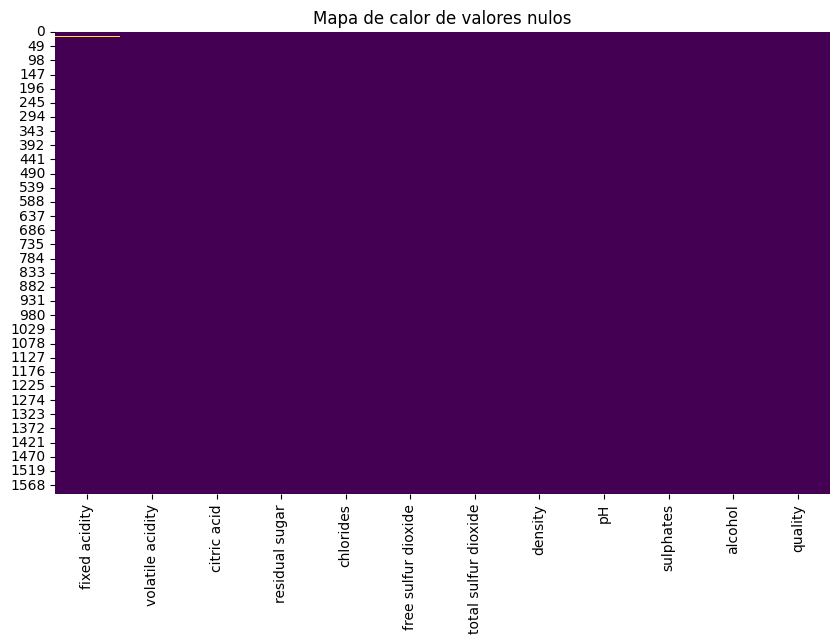

Nulos quality antes de imputación: 3


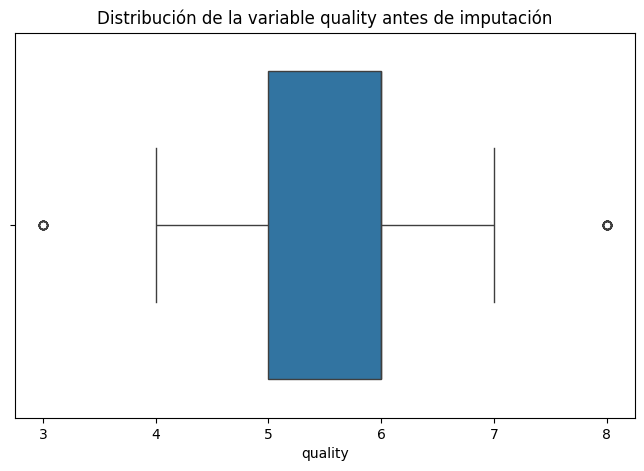

Nulos quality después de imputación: 0
Outliers quality después de imputación: 0


C:\Users\ASUS\AppData\Local\Temp\ipykernel_17844\3796357493.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['quality'].fillna(moda_quality, inplace=True)


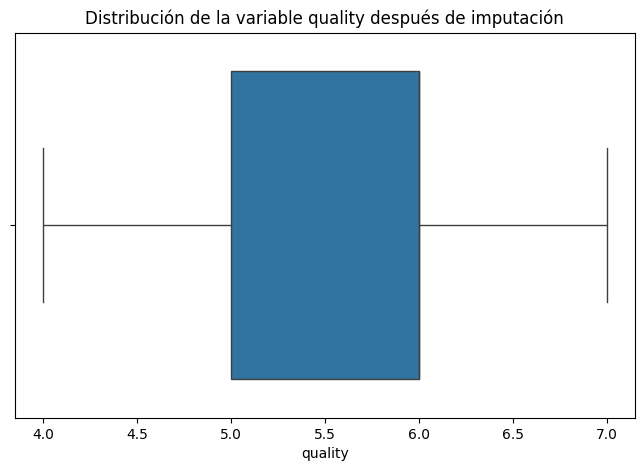

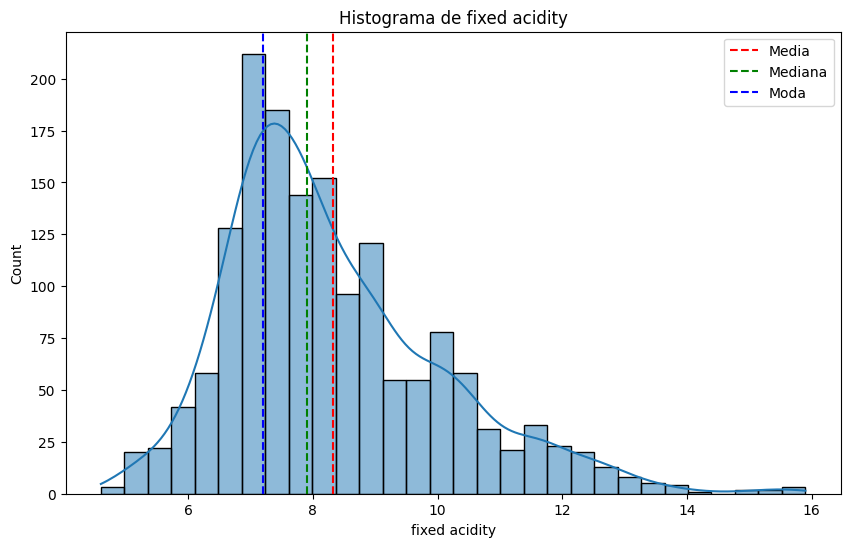

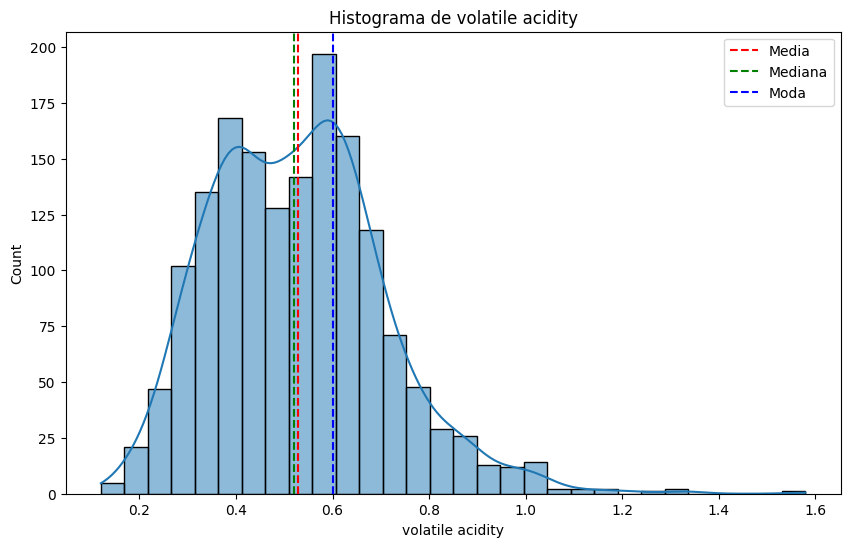

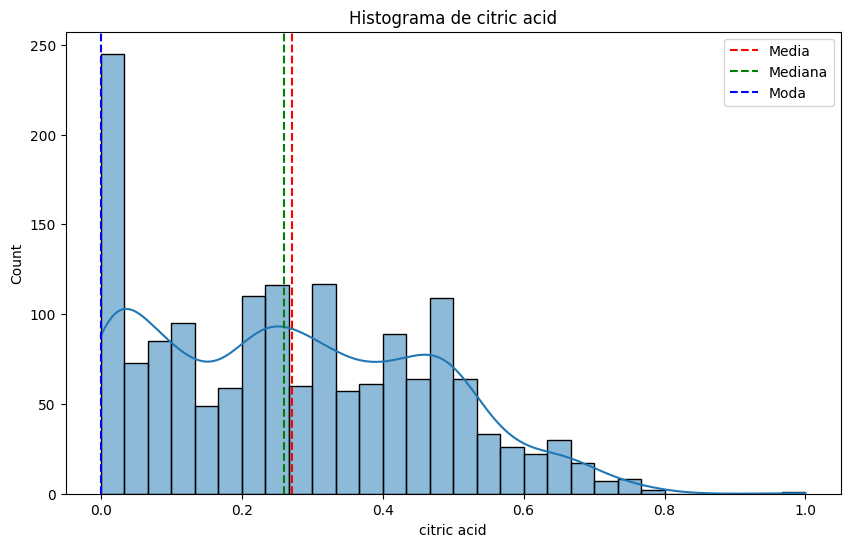

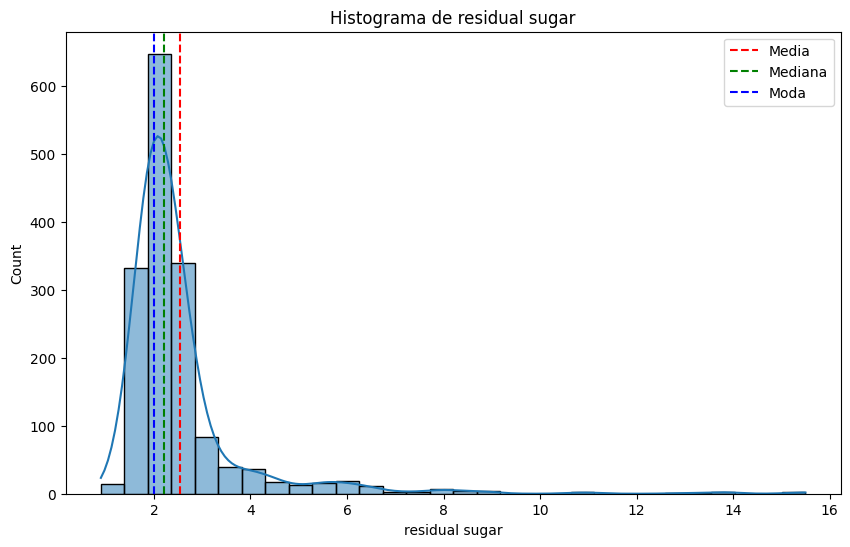

...

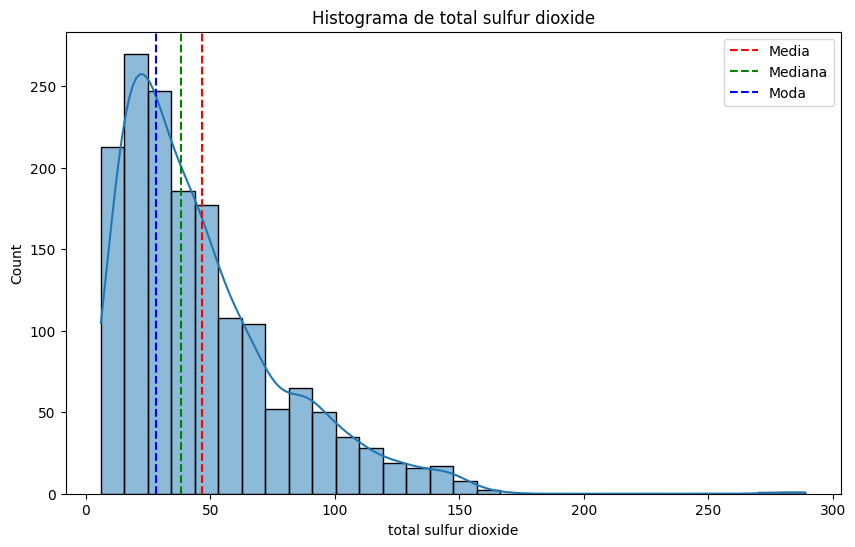

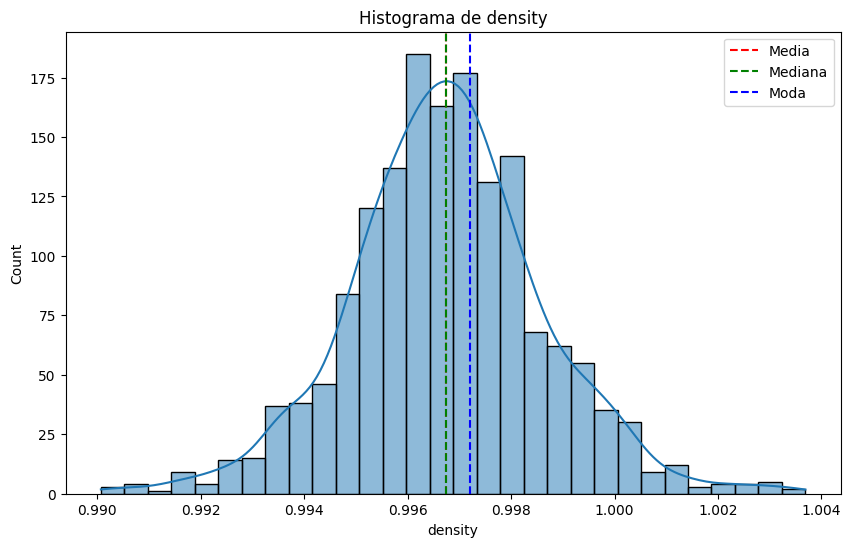

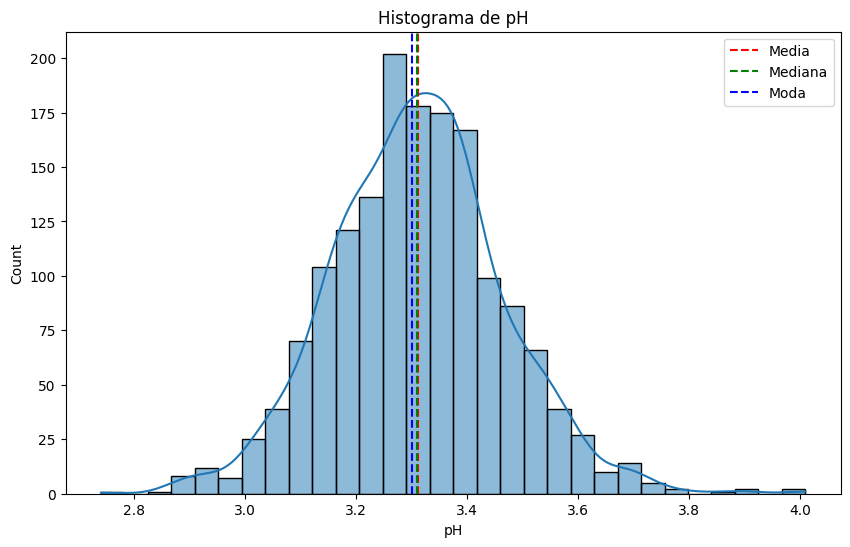

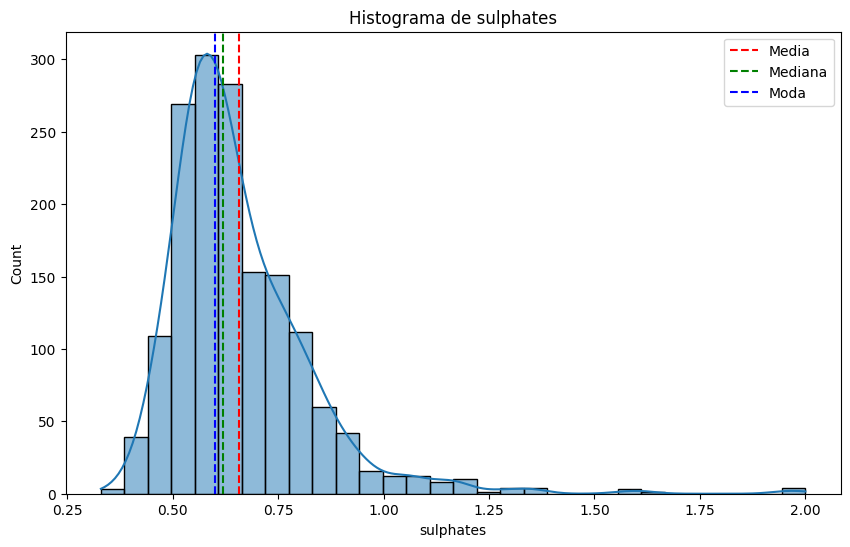

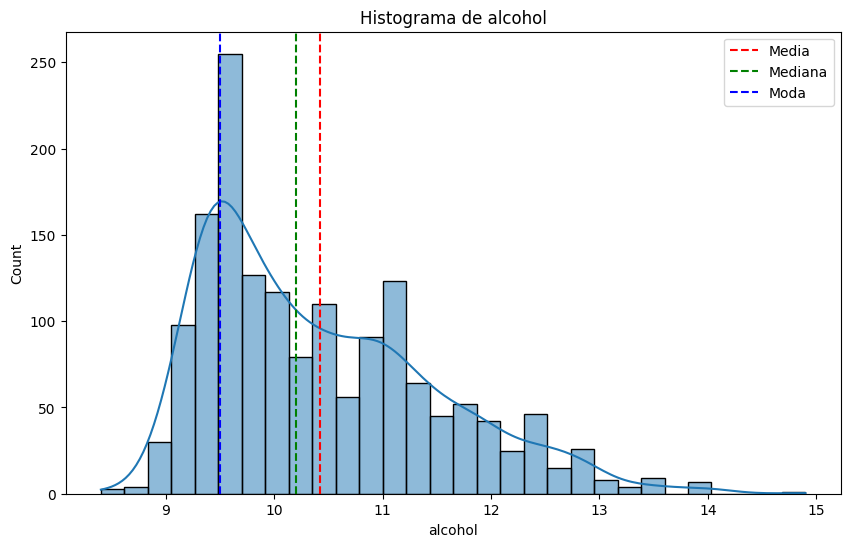

In [260]:
# 3. Tratamiento de outliers.
# a. Muestra numéricamente los valores NaN de este dataset en orden descendente.
print(df.isnull().sum().sort_values(ascending=False))
# b. Muestra gráficamente estos valores nulos mediante un mapa de calor.
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Mapa de calor de valores nulos')
plt.show()
# c. Imputar outliers (y nulos) de la variable categórica 'quality' con la moda. Verifica que se ha llevado a cabo la imputación de forma numérica y grafica.
# Antes de la imputación
print("Nulos quality antes de imputación:", df['quality'].isnull().sum())
plt.figure(figsize=(8, 5))
sns.boxplot(x='quality', data=df)
plt.title('Distribución de la variable quality antes de imputación')
plt.show()
moda_quality = df['quality'].mode()[0]

df['quality'].fillna(moda_quality, inplace=True)
Q1 = df['quality'].quantile(0.25)
Q3 = df['quality'].quantile(0.75)
IQR = Q3 - Q1

limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR

df.loc[df['quality'] < limite_inferior, 'quality'] = moda_quality
df.loc[df['quality'] > limite_superior, 'quality'] = moda_quality

print("Nulos quality después de imputación:", df['quality'].isnull().sum())
# Filtrar los outliers
outliers_quality = df['quality'][(df['quality'] < limite_inferior) | (df['quality'] > limite_superior)] #Serie Pandas con índices y valores de outliers
print("Outliers quality después de imputación:", len(outliers_quality))
plt.figure(figsize=(8, 5))
sns.boxplot(x='quality', data=df)
plt.title('Distribución de la variable quality después de imputación')
plt.show()
# d. Construye una función que, dado un dataframe y una cadena con el nombre de una variable, muestre un histograma de una variable predictora,
#    y líneas de colores para representar la media, la mediana y la moda.Toma nota de las posibles asimetrías de las variables.
def histograma(df, nombre_columna):
    plt.figure(figsize=(10, 6))
    sns.histplot(df[nombre_columna], bins=30, kde=True)
    plt.axvline(df[nombre_columna].mean(), color='r', linestyle='--', label='Media')
    plt.axvline(df[nombre_columna].median(), color='g', linestyle='--', label='Mediana')
    plt.axvline(df[nombre_columna].mode()[0], color='b', linestyle='--', label='Moda')
    plt.title(f'Histograma de {nombre_columna}')
    plt.legend()
    plt.show()
# e. Utilizando la función anterior muestra, mediante un bucle for, los histogramas de todas las variables predictoras del dataset.
target = 'quality'  # Variable objetivo
variables_predictoras = [col for col in df.columns if col != target]
for var in variables_predictoras:
    histograma(df, var)


In [261]:
# 4. Asimetría.
# a. Calcula el coeficiente de simetría (Skew) de las variables predictoras del DataFrame.
asimetria = df[variables_predictoras].skew()
# b. Realiza una tabla, como la mostrada en la celda con título: Asimetría (Skewness) en un DataFrame, con el correspondiente análisis de las variables.
asimetria_df = pd.DataFrame({
    'Variable': asimetria.index,
    'Skewness': asimetria.values,
    'Análisis': ['Simétrica' if -0.5 <= val <= 0.5 else 'Ligeramente asimétrica positiva' if 0.5 < val <= 1 else 'Asimétrica positiva' if val > 1 else 'Ligeramente asimétrica negativa' if -1 <= val < -0.5 else 'Asimétrica negativa' for val in asimetria.values]
})
print(asimetria_df)

                Variable  Skewness                         Análisis
0          fixed acidity  0.981431  Ligeramente asimétrica positiva
1       volatile acidity  0.671593  Ligeramente asimétrica positiva
2            citric acid  0.318337                        Simétrica
3         residual sugar  4.540655              Asimétrica positiva
4              chlorides  5.680347              Asimétrica positiva
5    free sulfur dioxide  1.250567              Asimétrica positiva
6   total sulfur dioxide  1.515531              Asimétrica positiva
7                density  0.071288                        Simétrica
8                     pH  0.193683                        Simétrica
9              sulphates  2.428672              Asimétrica positiva
10               alcohol  0.860829  Ligeramente asimétrica positiva


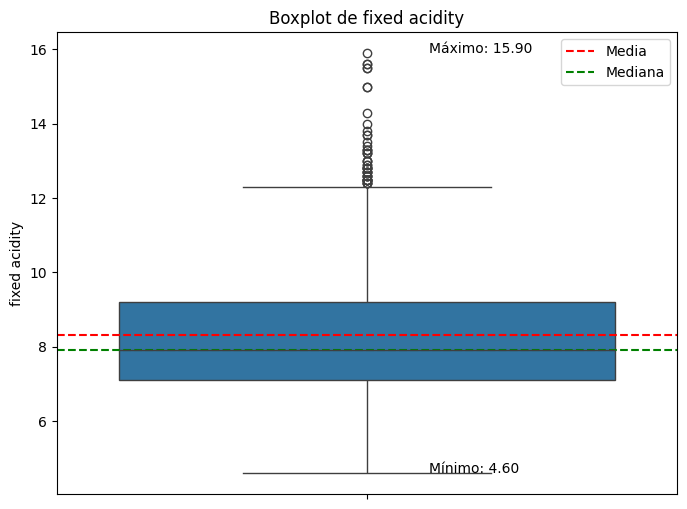

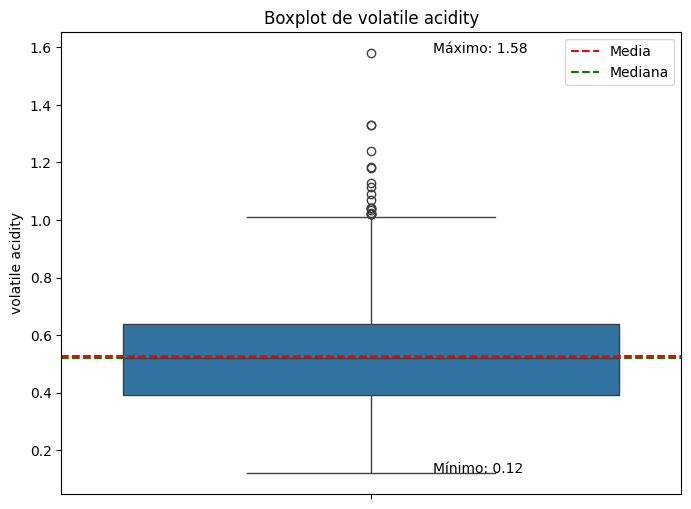

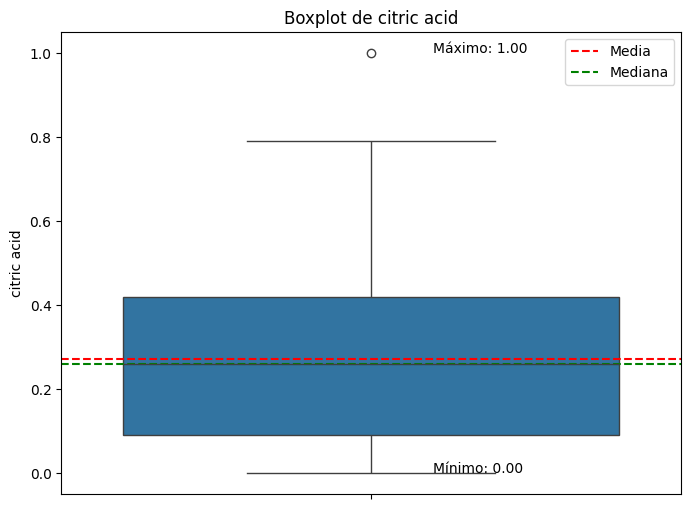

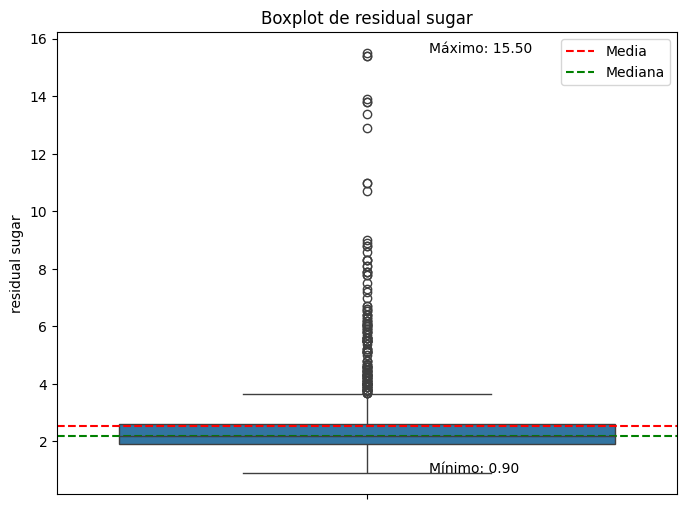

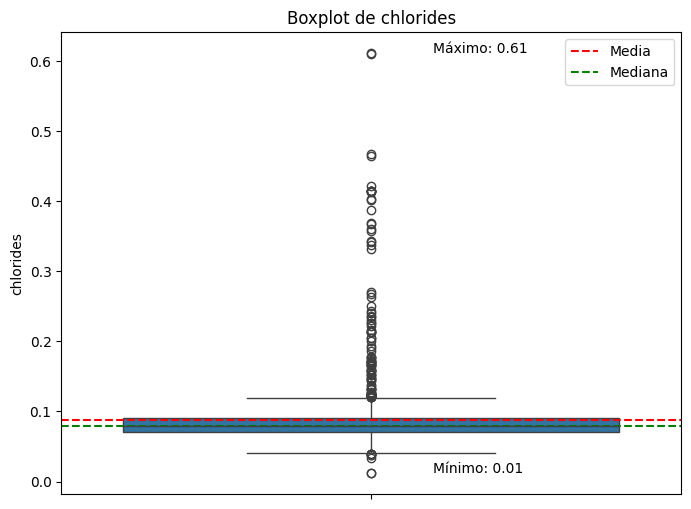

...

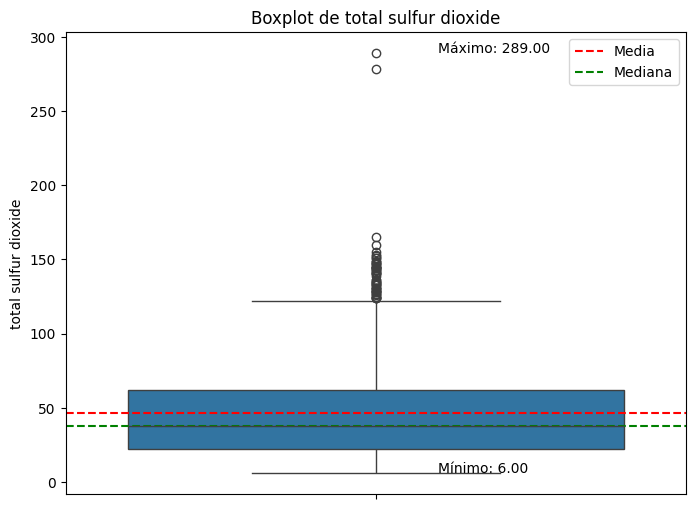

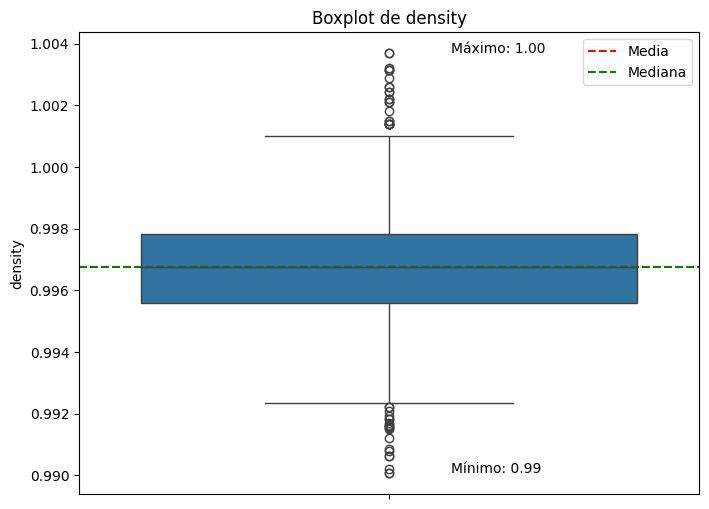

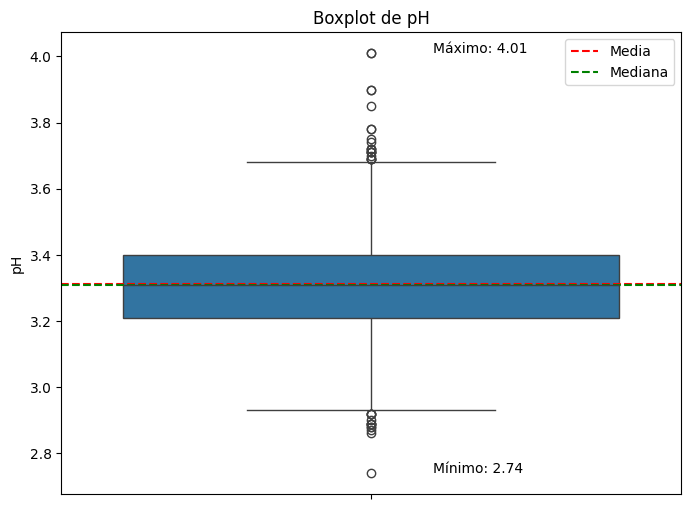

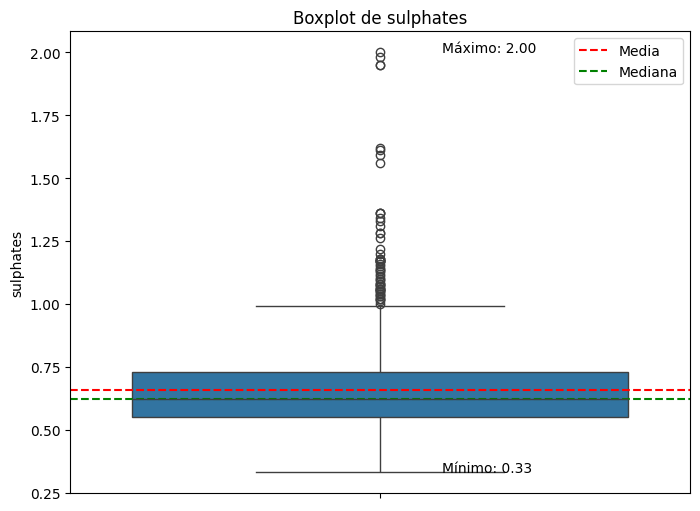

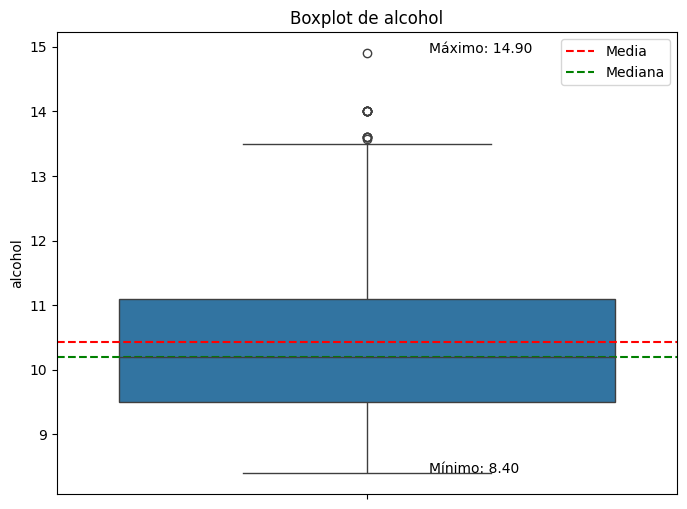

In [262]:
# 5. Boxplot y outliers.
# a. Construye una función que, dado un dataframe y una cadena con el nombre de una variable predictora, 
#    muestre el boxplot de la variable predictora, su media, mediana, máximo y mínimo.
def boxplot(df, nombre_columna):
    plt.figure(figsize=(8, 6))
    sns.boxplot(y=df[nombre_columna])
    plt.title(f'Boxplot de {nombre_columna}')
    plt.axhline(df[nombre_columna].mean(), color='r', linestyle='--', label='Media')
    plt.axhline(df[nombre_columna].median(), color='g', linestyle='--', label='Mediana')
    plt.text(0.1, df[nombre_columna].max(), f'Máximo: {df[nombre_columna].max():.2f}', color='black')
    plt.text(0.1, df[nombre_columna].min(), f'Mínimo: {df[nombre_columna].min():.2f}', color='black')
    plt.legend()
    plt.show()
# b. Utilizando esta función, muestra  -mediante un bucle for- todos los boxplots correspondientes a las variables predictoras.
for var in variables_predictoras:
    boxplot(df, var)

In [263]:
# 6. Imputación de variables predictoras.
# a. Construye una función que, dado un dataframe y una cadena con el nombre de una variable predictora, devuelva los valores fuera de este rango.
#    Muéstralos para todas las variables reutilizando la función anterior.
def valores_fuera_rango(dataframe, variable):
    Q1 = dataframe[variable].quantile(0.25)
    Q3 = dataframe[variable].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - 3 * IQR
    limite_superior = Q3 + 3 * IQR
    outliers = dataframe[(dataframe[variable] < limite_inferior) | (dataframe[variable] > limite_superior)][variable]
    return outliers
for var in variables_predictoras:
    outliers = valores_fuera_rango(df, var)
    print(f'Outliers en {var}:')
    display(outliers)
# b. De cada variable con valores que se encuentran fuera del rango [-3*IRQ, +3*IRQ], realizar la sustitución (imputación) de estos valores
#    de la siguiente forma: mediana para distribuciones asimétricas y media para distribuciones aproximadamente simétricas. Justifica tus elecciones.
#    Ten en cuenta que la mediana y la moda deben calcularse con los valores en el rango [-3*IRQ, +3*IRQ].
for var in variables_predictoras:
    Q1 = df[var].quantile(0.25)
    Q3 = df[var].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR
    
    non_outlier_values = df[(df[var] >= limite_inferior) & (df[var] <= limite_superior)][var]
    
    if abs(asimetria[var]) <= 0.5:
        replacement_value = non_outlier_values.mean()
    else:
        replacement_value = non_outlier_values.median()
    
    df.loc[(df[var] < limite_inferior) | (df[var] > limite_superior), var] = replacement_value
# c. Demuestra que ya no existen valores fuera del rango, por ejemplo, calculando la cantidad de valores de cada variable fuera de rango. Debe ser 0.
for var in variables_predictoras:
    outliers = valores_fuera_rango(df, var)
    print(f'Cantidad de outliers en {var} después de la imputación: {len(outliers)}')


Outliers en fixed acidity:


442    15.6
554    15.5
555    15.5
557    15.6
652    15.9
Name: fixed acidity, dtype: float64

Outliers en volatile acidity:


1299    1.58
Name: volatile acidity, dtype: float64

Outliers en citric acid:


Series([], Name: citric acid, dtype: float64)

Outliers en residual sugar:


9        6.1
11       6.1
33      10.7
35       5.5
39       5.9
        ... 
1478     5.7
1558     6.7
1574    13.9
1577     5.1
1589     7.8
Name: residual sugar, Length: 88, dtype: float64

Outliers en chlorides:


14      0.176
15      0.170
17      0.368
19      0.341
38      0.172
        ...  
1436    0.169
1474    0.205
1476    0.205
1558    0.235
1570    0.230
Name: chlorides, Length: 67, dtype: float64

Outliers en free sulfur dioxide:


396     68.0
400     68.0
1244    72.0
1558    66.0
Name: free sulfur dioxide, dtype: float64

Outliers en total sulfur dioxide:


1079    278.0
1081    289.0
Name: total sulfur dioxide, dtype: float64

Outliers en density:


Series([], Name: density, dtype: float64)

Outliers en pH:


1316    4.01
1321    4.01
Name: pH, dtype: float64

Outliers en sulphates:


13      1.56
17      1.28
81      1.28
86      1.95
91      1.95
92      1.98
106     1.31
151     2.00
169     1.59
226     1.61
339     1.36
614     1.36
639     1.36
723     1.62
1051    1.34
1319    1.33
Name: sulphates, dtype: float64

Outliers en alcohol:


Series([], Name: alcohol, dtype: float64)

Cantidad de outliers en fixed acidity después de la imputación: 0
Cantidad de outliers en volatile acidity después de la imputación: 0
Cantidad de outliers en citric acid después de la imputación: 0
Cantidad de outliers en residual sugar después de la imputación: 0
Cantidad de outliers en chlorides después de la imputación: 0
Cantidad de outliers en free sulfur dioxide después de la imputación: 0
Cantidad de outliers en total sulfur dioxide después de la imputación: 0
Cantidad de outliers en density después de la imputación: 0
Cantidad de outliers en pH después de la imputación: 0
Cantidad de outliers en sulphates después de la imputación: 0
Cantidad de outliers en alcohol después de la imputación: 0


                      fixed acidity  volatile acidity  citric acid  \
fixed acidity              1.000000         -0.259634     0.609036   
volatile acidity          -0.259634          1.000000    -0.564258   
citric acid                0.609036         -0.564258     1.000000   
residual sugar             0.224059          0.015628     0.149629   
chlorides                  0.226620          0.138031     0.089435   
free sulfur dioxide       -0.145924          0.005121    -0.060285   
total sulfur dioxide      -0.113860          0.090000    -0.011330   
density                    0.557328          0.000529     0.338487   
pH                        -0.596465          0.225669    -0.527050   
sulphates                  0.176021         -0.315552     0.277963   
alcohol                   -0.048185         -0.213708     0.129814   
quality                    0.115337         -0.346885     0.216319   

                      residual sugar  chlorides  free sulfur dioxide  \
fixed acidity    

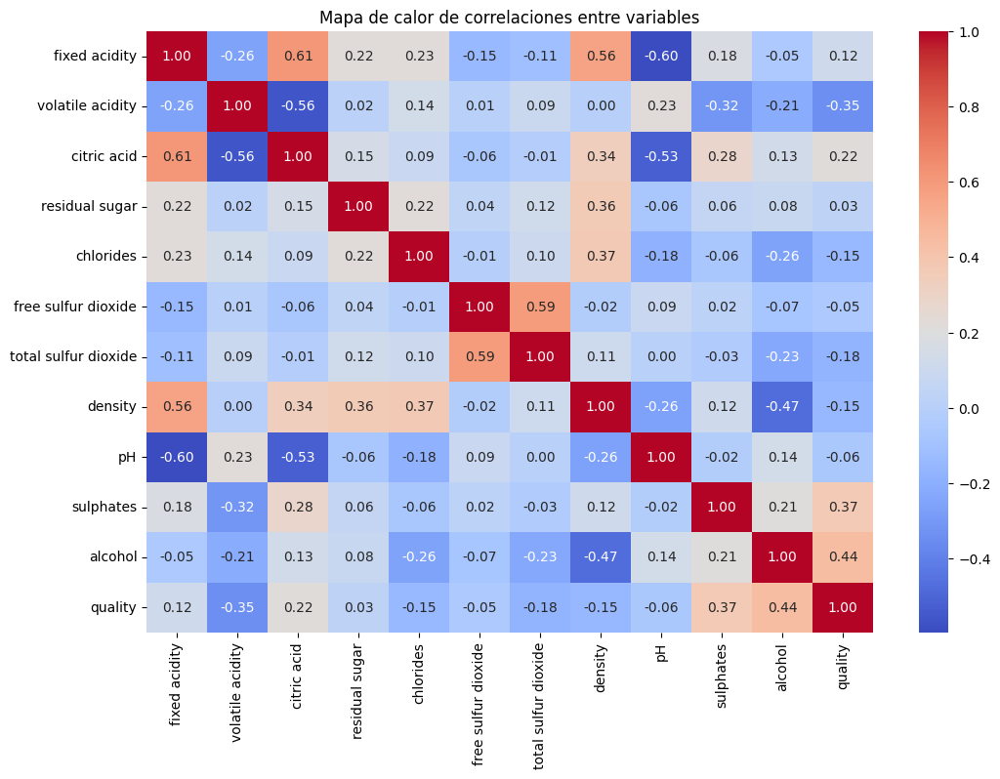

No hay variables con correlación absoluta > 0.75. No se recomienda eliminar predictoras solo por correlación lineal.


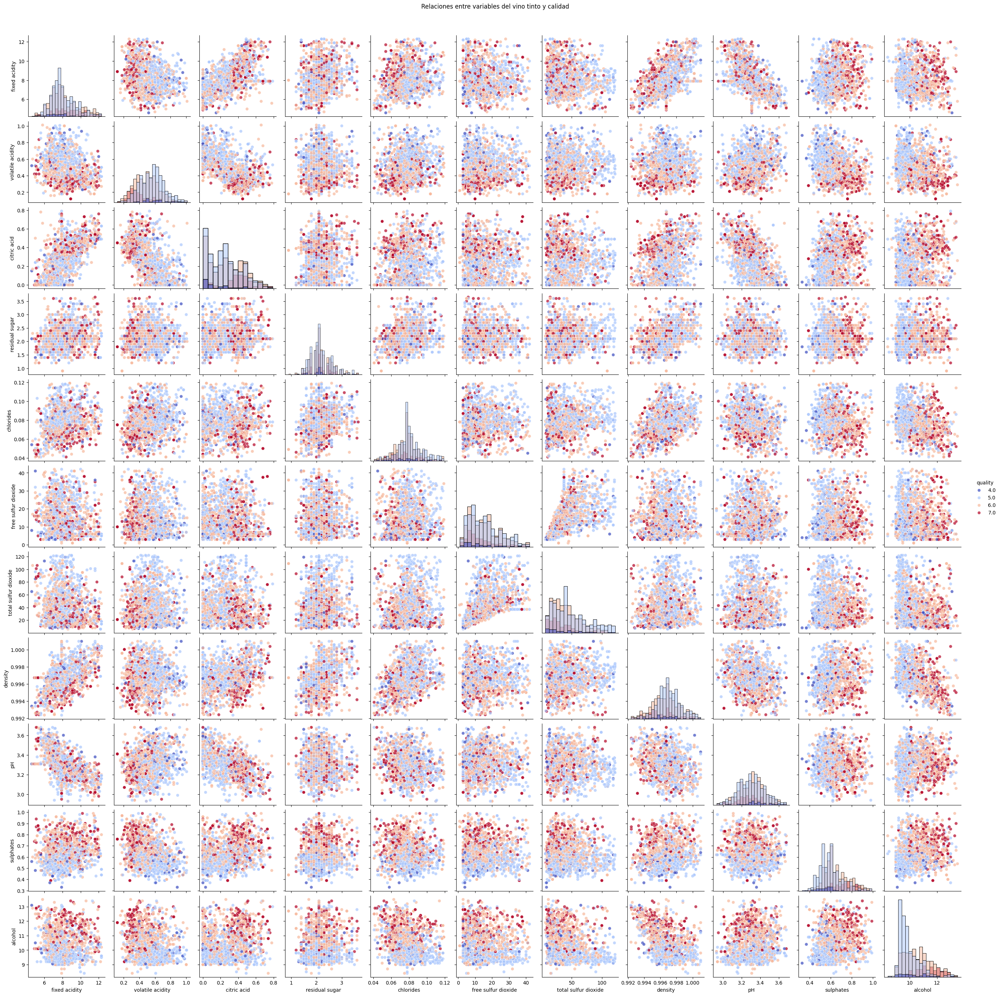

In [264]:
# 7. Correlación entre variables
# a. Muestra las correlaciones entre las variables del dataset, de forma numérica y gráfica mediante un diagrama de calor.
import numpy as np


correlacion = df.corr()
print(correlacion)
plt.figure(figsize=(12, 8))
sns.heatmap(correlacion, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Mapa de calor de correlaciones entre variables')
plt.show()
# b. Realiza la tabla que se encuentra en el cuaderno práctica1, donde se muestra un análisis de la correlación entre las variables del dataset.
#    En base a esta información, ¿puedes eliminar alguna variable predictora? Justifica tu respuesta.
corr_pairs = (
    correlacion.abs()
    .where(~np.eye(correlacion.shape[0], dtype=bool))
    .stack()
    .reset_index()
    .rename(columns={'level_0': 'var1', 'level_1': 'var2', 0: 'abs_corr'})
)
corr_pairs['corr'] = corr_pairs.apply(lambda r: correlacion.loc[r.var1, r.var2], axis=1)
corr_pairs = corr_pairs.sort_values('abs_corr', ascending=False).reset_index(drop=True)
corr_threshold = 0.75
high_corr = corr_pairs[corr_pairs['abs_corr'] > corr_threshold]
if not high_corr.empty:
    print("Variables con alta correlación (>|0.75|):")
    display(high_corr)
    print("\nRecomendaciones:")
    for _, row in high_corr.iterrows():
        print(f"- Considerar eliminar una de: {row.var1} / {row.var2} (r = {row.corr:.2f})")
else:
    print("No hay variables con correlación absoluta > 0.75. No se recomienda eliminar predictoras solo por correlación lineal.")





# Esto no es pero es util
sns.pairplot(df,
            hue='quality',             
            diag_kind='hist',          
            palette='coolwarm',    
            plot_kws={'alpha': 0.7,    
                        's': 40}               
             )
plt.suptitle("Relaciones entre variables del vino tinto y calidad", y=1.02 )
plt.show()


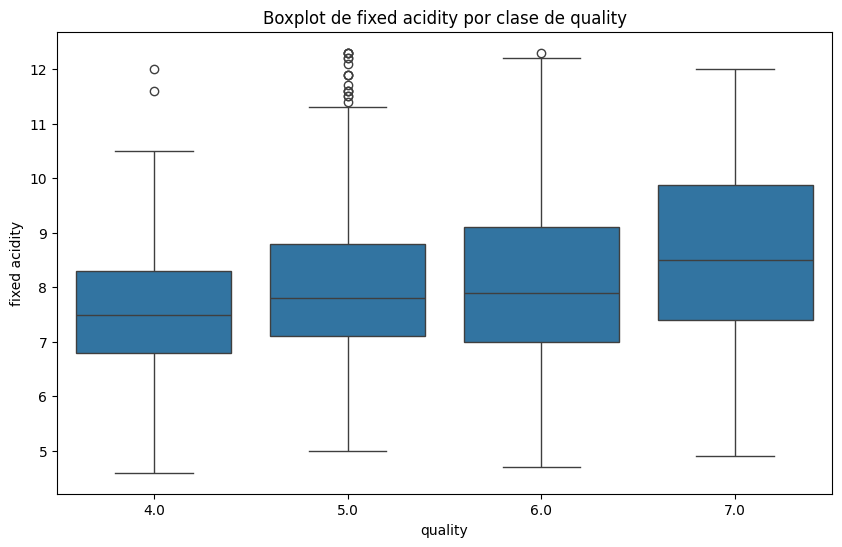

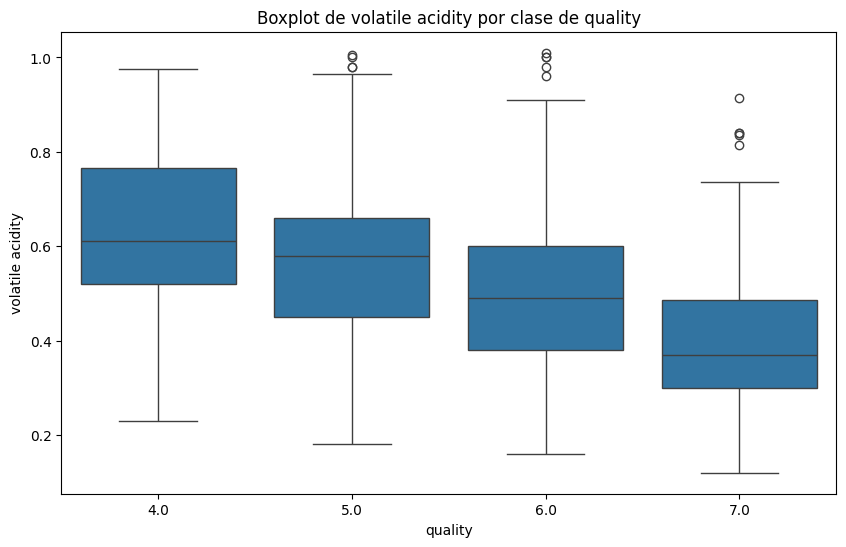

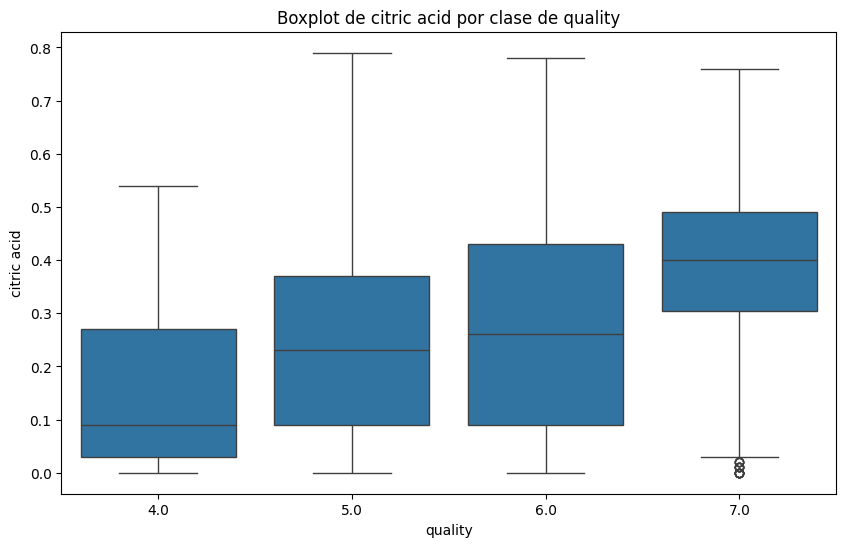

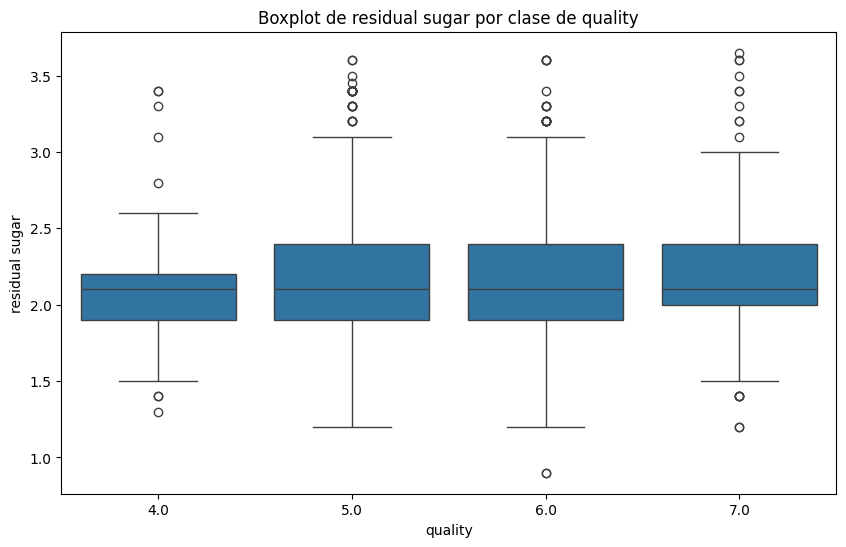

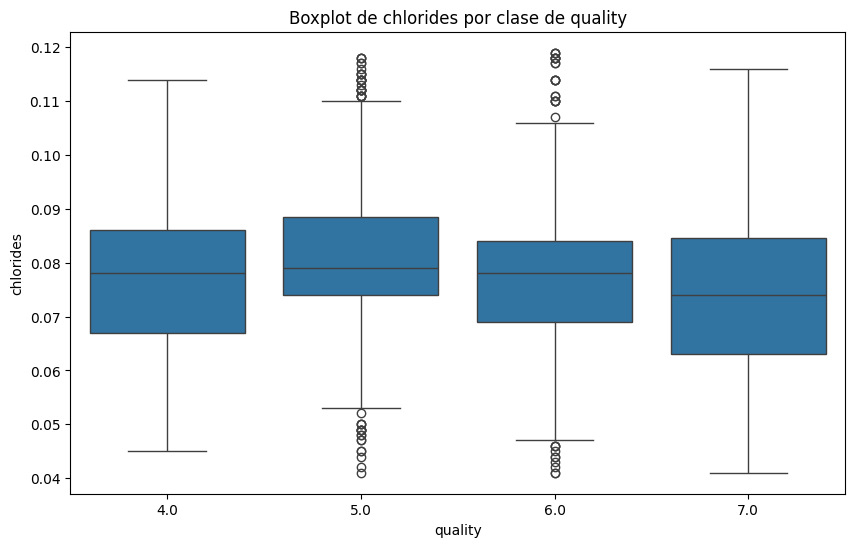

...

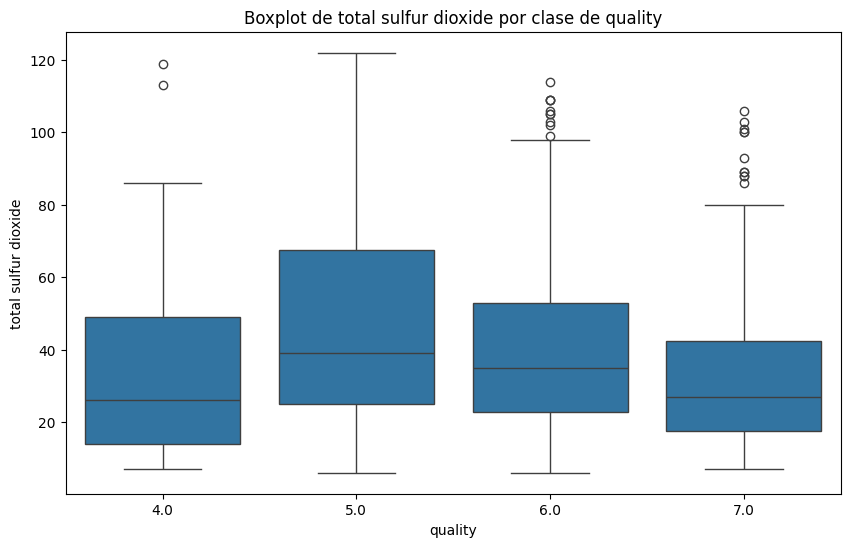

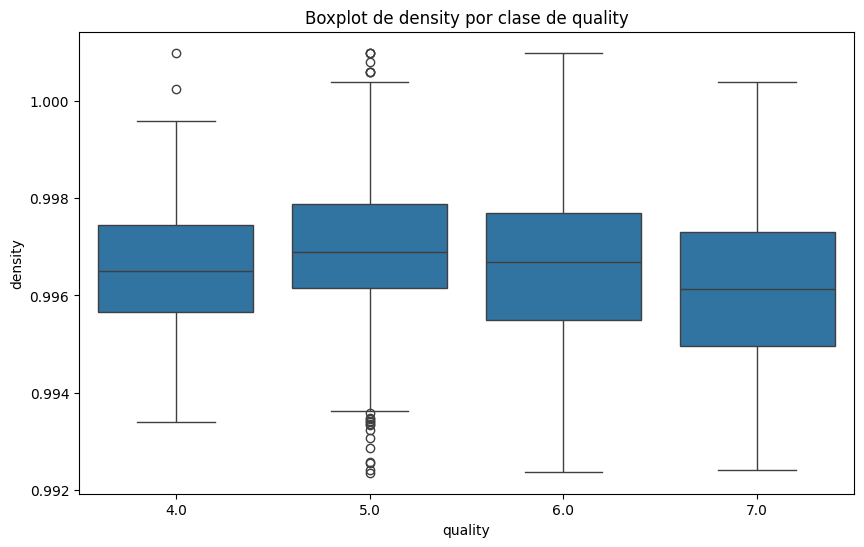

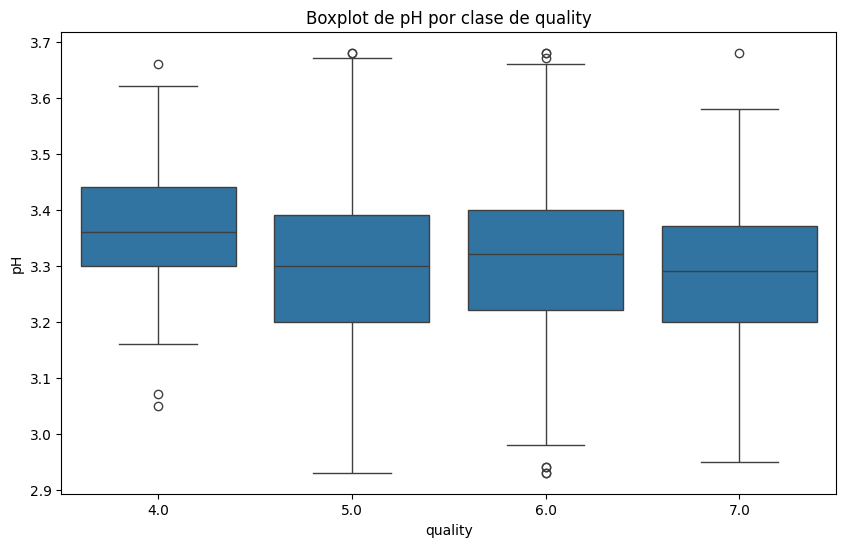

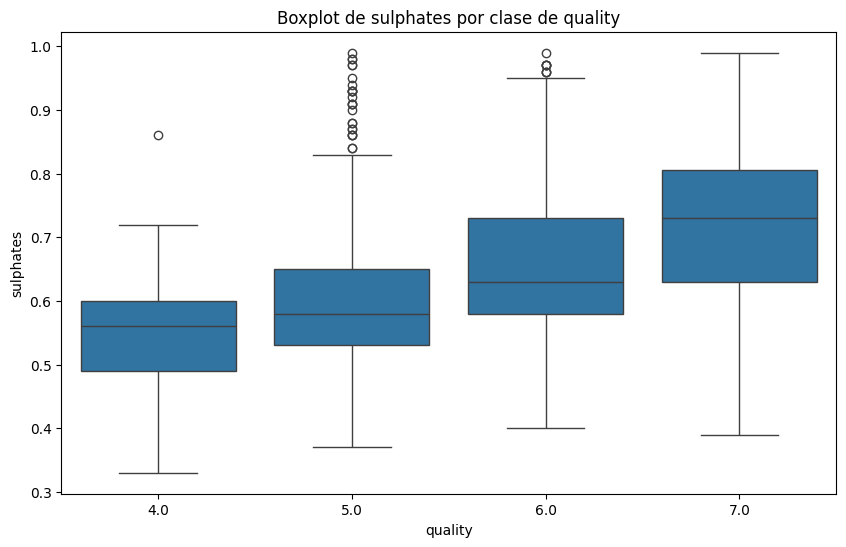

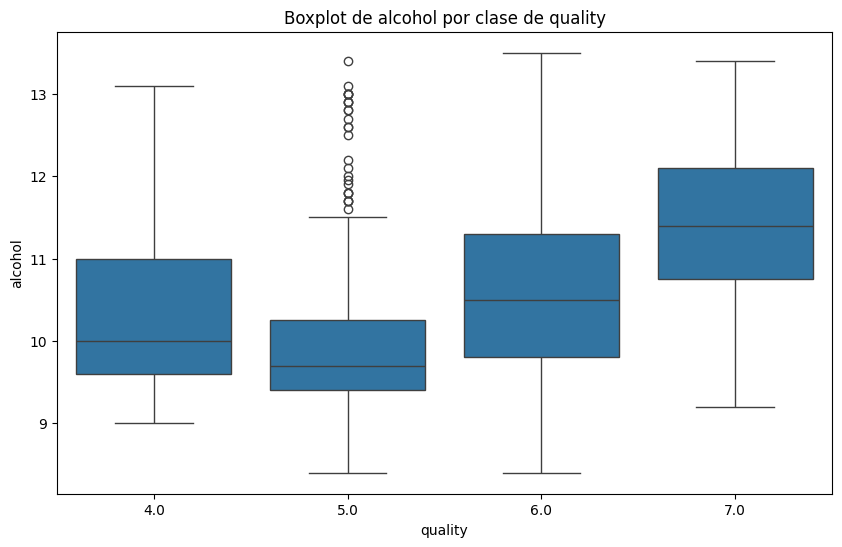

In [265]:
# 8. Gráficos y análisis de distribución de variables por clase. Boxplots.
# a. Construye una función que, dado un dataframe, una cadena con el nombre de una variable predictora y una cadena con la variable objetivo
#    muestre el boxplot de la variable predictora para cada valor de clase.
def boxplot_por_clase(df, nombre_variable, nombre_objetivo):
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=nombre_objetivo, y=nombre_variable, data=df)
    plt.title(f'Boxplot de {nombre_variable} por clase de {nombre_objetivo}')
    plt.xlabel(nombre_objetivo)
    plt.ylabel(nombre_variable)
    plt.show()
# b. Utilizando esta función, muestra  -mediante un bucle for- todos los boxplots por clase, correspondientes a las variables predictoras.
for var in variables_predictoras:
    boxplot_por_clase(df, var, 'quality')
# c. Con base a las gráficas anteriores, ¿qué conclusiones puedes extraer?

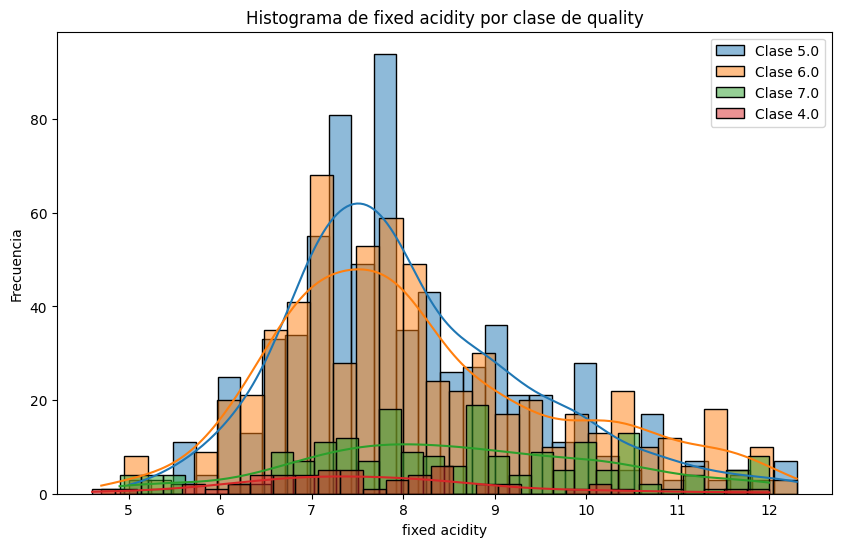

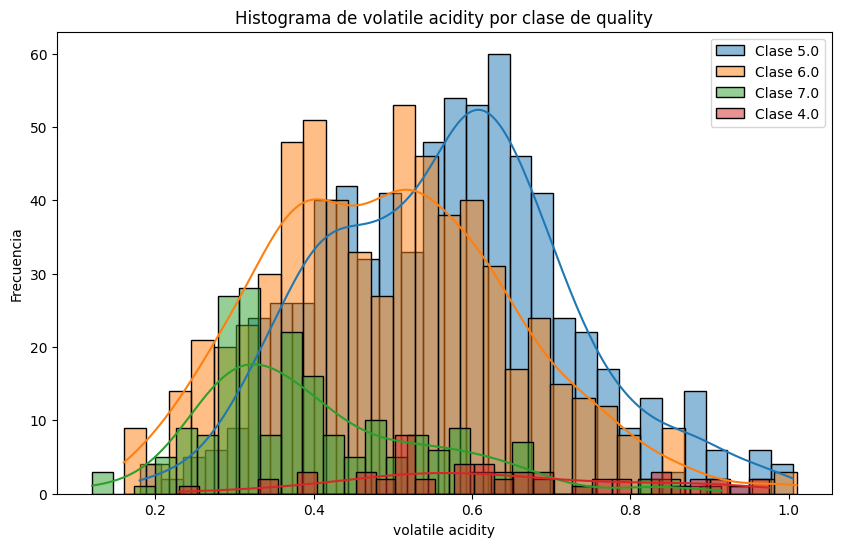

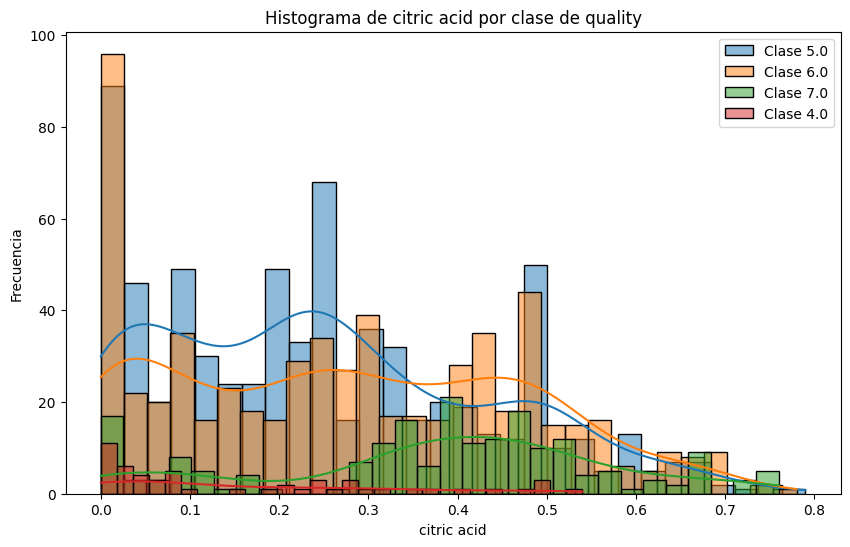

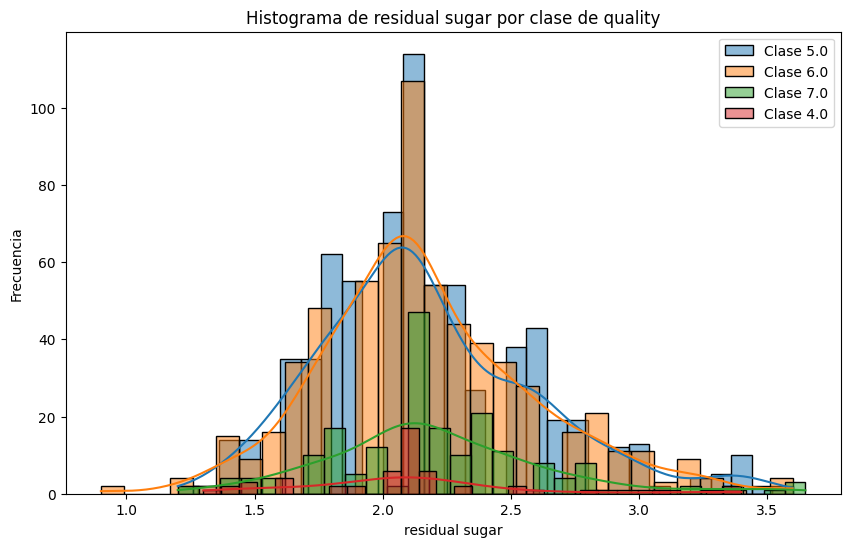

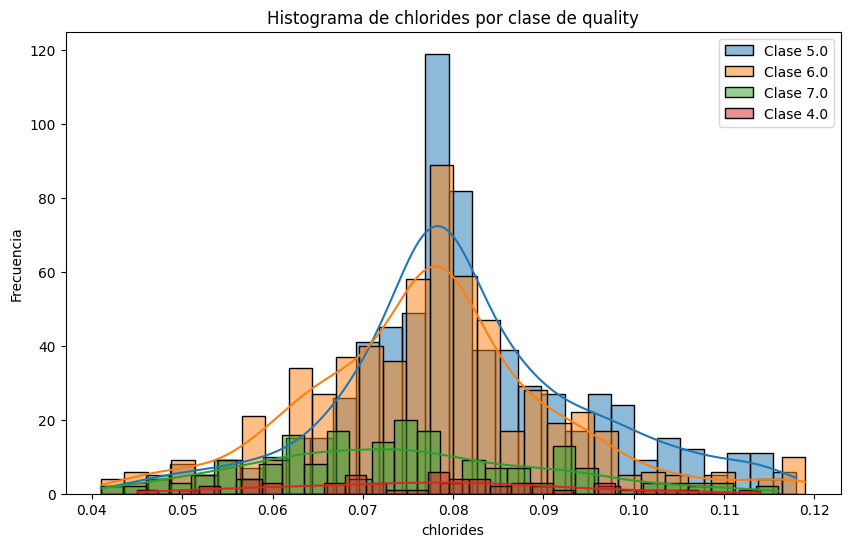

...

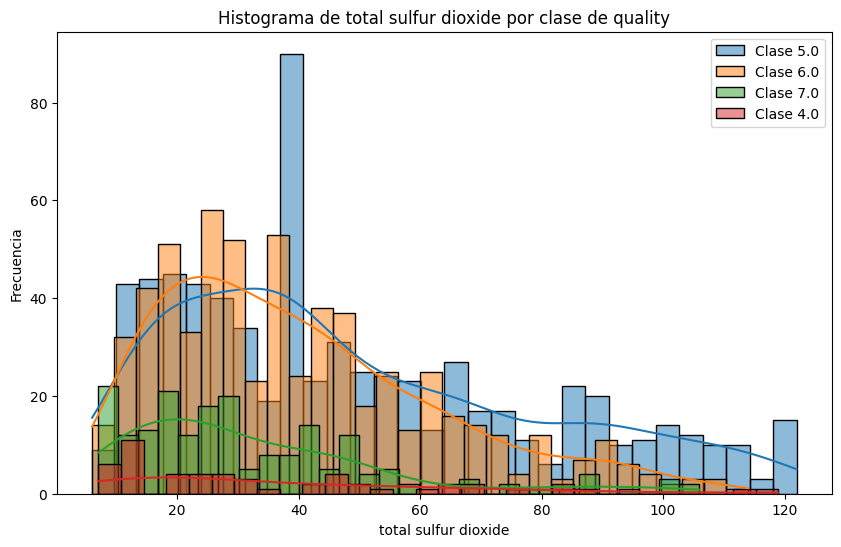

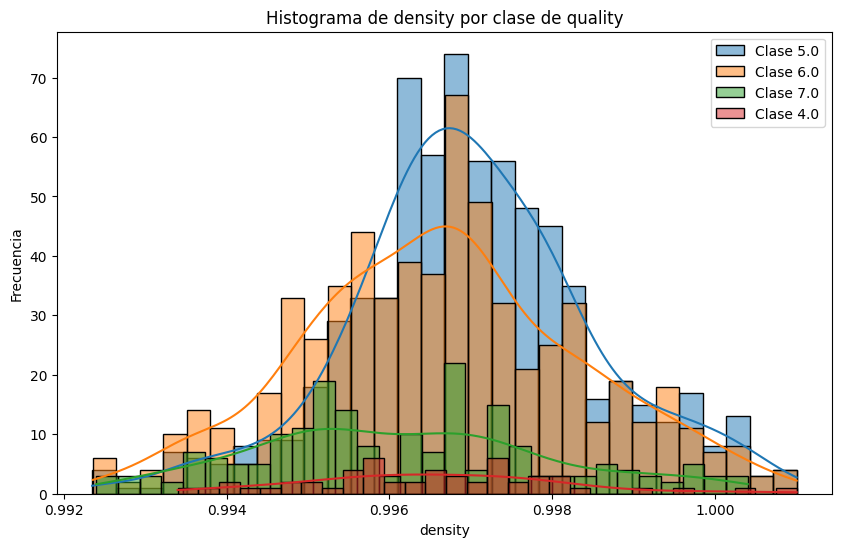

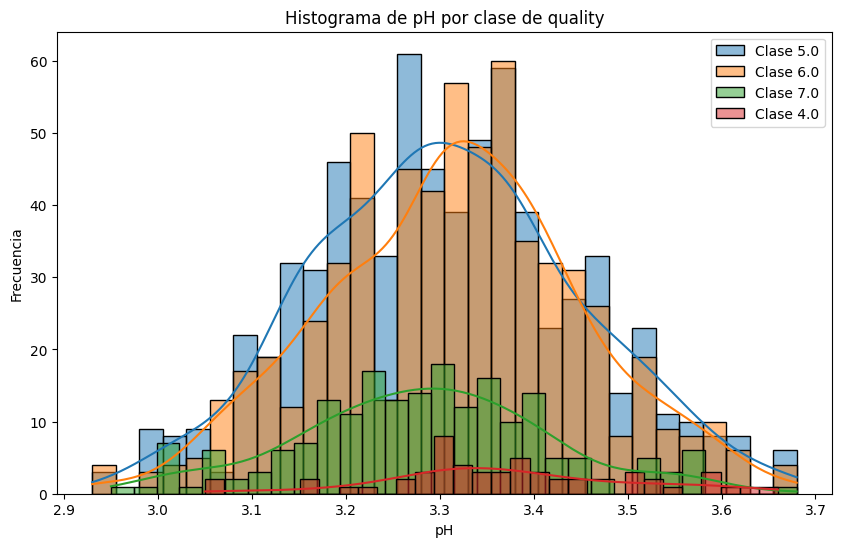

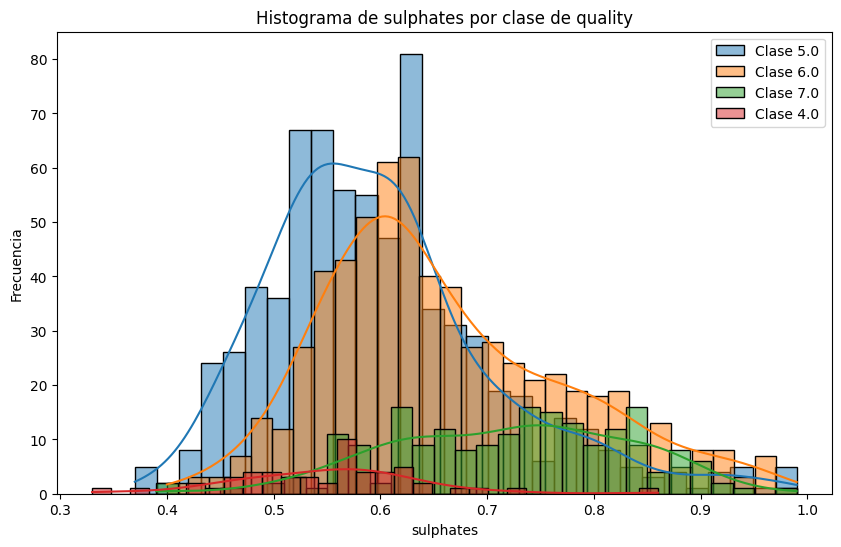

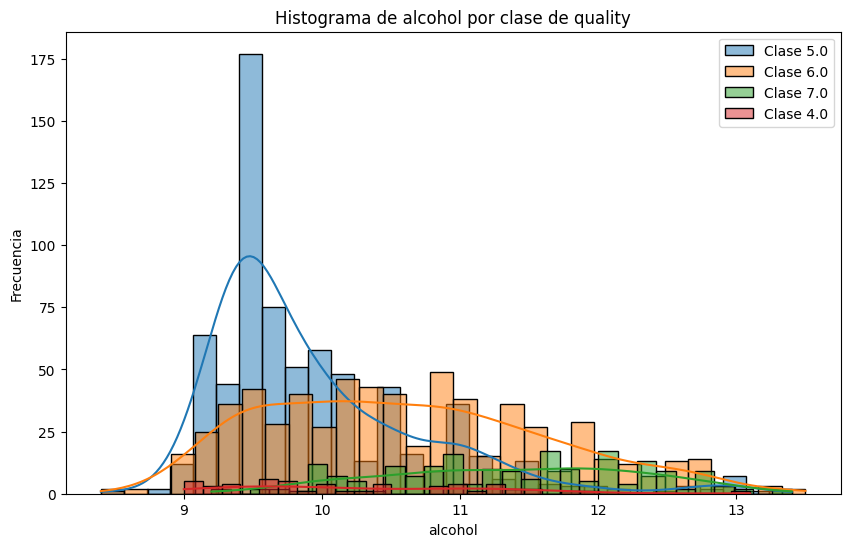

In [266]:
# 9. Gráficos y análisis de distribución de variables por clase. Histogramas.
# a. Construye una función que, dado un dataframe, una cadena con el nombre de una variable predictora y una cadena con la variable objetivo
#    muestre el histograma de la variable predictora para cada valor de clase.
def histograma_por_clase(df, nombre_variable, nombre_objetivo):
    plt.figure(figsize=(10, 6))
    clases = df[nombre_objetivo].unique()
    for clase in clases:
        subset = df[df[nombre_objetivo] == clase]
        sns.histplot(subset[nombre_variable], bins=30, kde=True, label=f'Clase {clase}', alpha=0.5)
    plt.title(f'Histograma de {nombre_variable} por clase de {nombre_objetivo}')
    plt.xlabel(nombre_variable)
    plt.ylabel('Frecuencia')
    plt.legend()
    plt.show()
# b. Utilizando esta función, muestra  -mediante un bucle for- todos los histogramas por clase, correspondientes a las variables predictoras.
for var in variables_predictoras:
    histograma_por_clase(df, var, 'quality')
# c. Con base a las gráficas anteriores, ¿qué conclusiones puedes extraer?

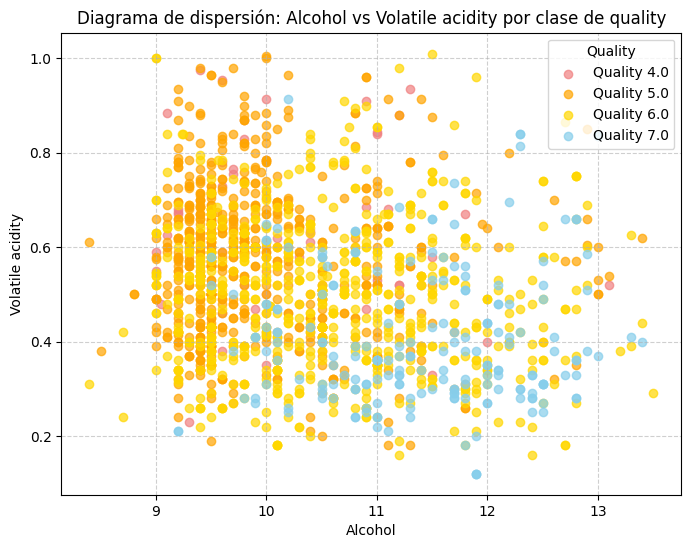

In [267]:
# 10. Gráficos y análisis de distribución de variables por clase. Scatter.
# a. Construye una función que, dado un dataframe, dos cadenas con dos nombres de dos variables predictoras y una cadena con la variable objetivo
#    muestre el scatter de las dos variables predictoras discriminadas por clase para cada valor de clase.
colores = ['lightcoral', 'orange', 'gold', 'skyblue', 'mediumseagreen', 'purple', 'brown', 'pink']
def scatter_quality(df, x_var='alcohol', y_var='volatile acidity', target='quality'):
    plt.figure(figsize=(8, 6))

    # Bucle para graficar cada clase de 'quality'
    for i, clase in enumerate(sorted(df[target].unique())):
        color = colores[i % len(colores)]  # ciclo de colores si hay más clases que colores
        plt.scatter(df[df[target] == clase][x_var],
                    df[df[target] == clase][y_var],
                    color=color,
                    alpha=0.7,
                    label=f'{target.capitalize()} {clase}')

    # Título y etiquetas
    plt.title(f'Diagrama de dispersión: {x_var.capitalize()} vs {y_var.capitalize()} por clase de {target}')
    plt.xlabel(x_var.capitalize())
    plt.ylabel(y_var.capitalize())

    # Leyenda y cuadrícula (estilo práctica 2)
    plt.legend(title=target.capitalize())
    plt.grid(True, linestyle='--', alpha=0.6)

    plt.show()
# b. Utilizando esta función, muestra  -mediante un bucle for- todos los scatters por clase, correspondientes a las variables predictoras.
scatter_quality(df, 'alcohol', 'volatile acidity', 'quality')
# c. Con base a las gráficas anteriores, ¿qué conclusiones generales puedes extraer?

### Ayuda para la respuesta a la pregunta 10.a. 

### Adapta este codigo a una función. Utiliza bucles for para compactar el código y, despues, reutilizarlo.


```python
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

# Clase 3
plt.scatter(df[df['quality'] == 3]['alcohol'],
            df[df['quality'] == 3]['volatile acidity'],
            color='lightcoral',
            alpha=0.7,
            label='Quality 3')

# Clase 4
plt.scatter(df[df['quality'] == 4]['alcohol'],
            df[df['quality'] == 4]['volatile acidity'],
            color='orange',
            alpha=0.7,
            label='Quality 4')

# Clase 5
plt.scatter(df[df['quality'] == 5]['alcohol'],
            df[df['quality'] == 5]['volatile acidity'],
            color='gold',
            alpha=0.7,
            label='Quality 5')

# Clase 6
plt.scatter(df[df['quality'] == 6]['alcohol'],
            df[df['quality'] == 6]['volatile acidity'],
            color='skyblue',
            alpha=0.7,
            label='Quality 6')

# Clase 7
plt.scatter(df[df['quality'] == 7]['alcohol'],
            df[df['quality'] == 7]['volatile acidity'],
            color='mediumseagreen',
            alpha=0.7,
            label='Quality 7')

# Clase 8
plt.scatter(df[df['quality'] == 8]['alcohol'],
            df[df['quality'] == 8]['volatile acidity'],
            color='purple',
            alpha=0.7,
            label='Quality 8')

# Título y etiquetas
plt.title('Diagrama de dispersión: Alcohol vs Acidez volátil por clase de calidad')
plt.xlabel('Contenido de alcohol (%)')
plt.ylabel('Acidez volátil (g/dm³)')

# Leyenda y cuadrícula (estilo práctica 2)
plt.legend(title='Quality')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()
```


In [268]:
# 11. Conjunto de entrenamiento y prueba.
# a. Utiliza el objeto train_test_split y obtén los conjutos de entrenamiento y prueba con 80% y 20% para los conjuntos train y test, respectivamente.
# b. Muestra el gráfico de la distribución porcentual de clases en cada conjunto de datos (celda 18, práctica2), ¿qué conclusiones puedes extraer?

In [269]:
# 12. Gráfico 3D
# a. Elige tres variables predictoras, represéntalas desde diferentes ángulos (5 combinaciones de azimut y altura).
# Haz esta representación mediante el uso iterativo de una función # que acepte un dataframe,
# tres cadenas de caracteres cada una de las cuales con el nombre de una variable predictora, un valor de azimut y un valor de altura.
# b. En base a la visualización anterior, extrae las conclusiones pertinentes.

In [270]:
# 13. Escalado del Dataset.
# a. Realiza el estandarizado de los conjuntos de entrenamiento y test, utilizando el objeto StandardScaler.
# b. Muestra los histogramas del conjunto de entrenamiento escalado. Verifica que son coherentes con el proceso de estandarización previo.
# c. Realiza un describe() de este conjunto, verifica que la media y desviación típica de la salida es coherente
#    con el proceso de estandarización previo.   

In [271]:
# 14. PCA (Análisis de Componentes Principales)
# a. Instancia un objeto PCA con 3 componentes principales.
# b. Entrena y transforma X_train. Transforma X_test.
# c. Escribe las ecuaciones de transformación de los componentes principales en función de las variables predictoras del dataset original.
# d. calcula un array que represente la proporción de varianza total del dataset que explica cada componente principal.
# e. Muestra una gráfica en la que se represente la varianza explicada y la varianza acumulada por cada componente principal (celda 30, práctica2).